# Replication 2: Julia
Group  : 1

Members:
- Juan José Tang
- Ursula Cotrina 
- Victoria Olivera



In [2]:
using Pkg


Pkg.add("DataFrames")
Pkg.add("Dates")
Pkg.add("CategoricalArrays")
Pkg.add("RData")
Pkg.add("Distributions")
Pkg.add("Gadfly")
Pkg.add("Plots")
Pkg.add("RDatasets")
Pkg.add("Compose")

using DataFrames
using Dates
using Statistics,RData  #upload data of R format 
using CategoricalArrays # categorical data
using Gadfly
using Plots

    Updating registry at `C:\Users\Victoria\.julia\registries\General`
    Updating git-repo `https://github.com/JuliaRegistries/General.git`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Use

## 1. Sample splitting

This method consists in randomly spliting a given sample in two subsamples: train and test. Usually, as a convention, it is set 75% for train and 25% for test. The training sample is used for estimating the parameters of the underlying model, while the testing sample is used to evalute the predictive capacity of the model with out-of-sample data. 

Let's suppose that we have a training sample, and we estimate the following model:

$$Y^{TR} = \beta_1 X_1^{TR}+\beta_2 X_2^{TR} + \epsilon^{TR}$$

Which will yield estimated values for the coefficients: $\widehat{\beta_1}$, $\widehat{\beta_2}$. Now, to evaluate the ability of this particular model to predict out-of-sample observations, we construct the predicted values of the testing sample:

$$\widehat{Y^{TE}} =\widehat{\beta_1} X_1^{TE}+\widehat{\beta_2} X_2^{TE}$$

Then, we could measure the MSE of these predictions:

$$MSE^{TE} = \frac{1}{N^{TE}}\sum_{i=1}^{N^{TE}} \left(Y^{TE}-\widehat{Y^{TE}}\right)^2$$

## 2. Cross-Validation

It's an algorithm to estimate prediction errors.

Consider a sample that is partitioned in K blocks, or folds (generally, K = 5,10). The idea is to make recursive estimations of a given model, with varying training and testing samples. The k-fold cross validation method relies on the following steps:

Consider a number of values for the tuning parameter $\lambda_j = {\lambda_1,...,\lambda_m}$

Consider a number of folds $k = {1,...,K}$

1. For each $\lambda_j = {\lambda_1,...,\lambda_m}$

   1.1 For each $k = {1,...,K}$:
     
          1.1.1 Estimate the model using every fold BUT i-fold.

          1.1.2 With the coefficients estimated in (1.1.1), make an out-of-sample prediction of i-fold, calculate the estimation error and store it.
    
          1.1.3 Return to (1.1), and iterate over all others k = {1,...,K}.

   1.2 Return to (1) and iterate over all others  $\lambda_j = {\lambda_1,...,\lambda_m}$


This process will yield a set of estimation errors: for every observation inside an i-fold, for every fold, and for every $\lambda_j$. Over a particular $\lambda_j$, consider that the average error of all folds is given by:

$$Average Error (\lambda) = \frac{1}{N}\sum_{k=1}^K \sum_{i \in F_k} \left(y_i-\widehat{y_{\lambda}^{-k}}\right)^2$$

Where $\widehat{y_{\lambda}^{-k}}$ is the prediction of a particular observation in fold "k", made with coefficients from a regression over all other folds.

The optimal $\lambda$, from all posible $\lambda_j = {\lambda_1,...,\lambda_m}$ is be the one that minimizes the Average Error, that is:

$$\hat\lambda = \underset{\lambda \in {\lambda_1,...,\lambda_m}} {argmin} Average Error (\lambda)$$

We used K-cross Validation to estimate an optimal lambda in a context of a Lasso regression

## 3. Replication

In [3]:
rdata_read = load("../../data/wage2015_subsample_inference.RData")
data = rdata_read["data"]
names(data)
println("Number of Rows : ", size(data)[1],"\n","Number of Columns : ", size(data)[2],) #rows and columns

Number of Rows : 5150
Number of Columns : 20


In [4]:
Z = select(data, ["wage","lwage","sex","shs","hsg","scl","clg","ad","ne","mw","so","we","exp1"])
#wage lwage sex shs hsg scl clg ad exp1
data_female = filter(row -> row.sex == 1, data)
Z_female = select(data_female,["wage","lwage","sex","shs","hsg","scl","clg","ad","ne","mw","so","we","exp1"] )

data_male = filter(row -> row.sex == 0, data)
Z_male = select(data_male,["wage","lwage","sex","shs","hsg","scl","clg","ad","ne","mw","so","we","exp1"] )

means = DataFrame( variables = names(Z), All = describe(Z, :mean)[!,2], Men = describe(Z_male,:mean)[!,2], Female = describe(Z_female,:mean)[!,2])


,variables,All,Men,Female
,String,Float64,Float64,Float64
1,wage,23.4104,24.0193,22.6494
2,lwage,2.97079,2.98783,2.94948
3,sex,0.444466,0.0,1.0
4,shs,0.023301,0.0318071,0.0126693
5,hsg,0.243883,0.294303,0.180865
6,scl,0.278058,0.273331,0.283967
7,clg,0.31767,0.293953,0.347313
8,ad,0.137087,0.106606,0.175186
9,ne,0.227767,0.22195,0.235037


## 3.1 Descriptive Statistics

### Wage - Lwage

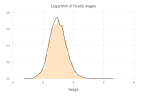

In [5]:
Gadfly.plot(Z, Coord.cartesian(xmin=0, xmax=8),
    layer(x = "lwage", Geom.density , color=[colorant"black"]),
    layer(x = "lwage", Geom.histogram(bincount=30, density=true, limits=(min=0,)),
    color=[colorant"bisque"]),
    Guide.title("Logarithm of hourly wages")
)

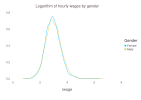

In [6]:
using Gadfly, Distributions
Z1=copy(Z)
Z1[!,:sex] = string.(Z[!,:sex]) 
replace!(Z1.sex, "1.0" => "Female")
replace!(Z1.sex, "0.0" => "Male")
rename!(Z1, "sex" => "Gender")
Gadfly.plot(Z1, x = "lwage", color="Gender", Geom.density, style(line_width=3mm), 
    Guide.title("Logarithm of hourly wages by gender"),
    Theme(grid_color = colorant"white", grid_color_focused = colorant"white")
)

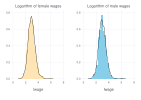

In [7]:
p1=Gadfly.plot(Z_female, Coord.cartesian(xmin=0, xmax=8),
    layer(x = "lwage", Geom.density , color=[colorant"black"]),
    layer(x = "lwage", Geom.histogram(bincount=25, density=true, limits=(min=0,)),
    color=[colorant"moccasin"]),
    Guide.title("Logarithm of female wages"))
p2=Gadfly.plot(Z_male, Coord.cartesian(xmin=0, xmax=8),
    layer(x = "lwage", Geom.density , color=[colorant"black"]),
    layer(x = "lwage", Geom.histogram(bincount=25, density=true, limits=(min=0,)),
    color=[colorant"skyblue"]),
    Guide.title("Logarithm of male wages"))
gridstack([p1 p2])

### Gender

In [8]:
using Compose
ZX=copy(Z1)
insertcols!(ZX,3
    ,:Freq => 1)  
ZX=combine(groupby(ZX, [:Gender]),:Freq=>sum=>:Frequency)

,Gender,Frequency
,String,Int64
1,Female,2289
2,Male,2861


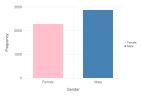

In [9]:
Gadfly.plot(ZX, x=:Gender,y=:Frequency,color=:Gender, Geom.bar(position=:dodge),
    Theme(bar_spacing=2cm, minor_label_font_size = 3.5mm),
    Scale.color_discrete_manual("pink","steelblue"),
    Guide.xticks(orientation=:horizontal),
    Guide.colorkey(""),
    Guide.yticks(ticks=[0,1000,2000,3000])
)

### Schooling

In [10]:
Z2 = copy(Z1)
replace!(Z2.hsg, 1 => 2)
replace!(Z2.scl, 1 => 3)
replace!(Z2.clg, 1 => 4)
replace!(Z2.ad,  1 => 5)
Z2=select(Z2,:wage,:lwage,:Gender,:shs,:hsg,:scl,:clg,:ad,:ne,:mw,:so,:we,:exp1,[:shs, :hsg, :scl, :clg, :ad] => (+) => :EducationLevel)

Z2[!,:EducationLevel] = string.(Z2[!,:EducationLevel]) 
replace!(Z2.EducationLevel, "1.0" => "A_SomeHighschool")
replace!(Z2.EducationLevel, "2.0" => "B_HighschoolGraduate")
replace!(Z2.EducationLevel, "3.0" => "C_SomeCollege")
replace!(Z2.EducationLevel, "4.0" => "D_CollegeGraduate")
replace!(Z2.EducationLevel, "5.0" => "E_AdvancedDegree")
select(Z2,:lwage,:shs,:scl,:hsg,:clg,:ad,:EducationLevel)

,lwage,shs,scl,hsg,clg,ad,EducationLevel
,Float64,Float64,Float64,Float64,Float64,Float64,String
1,2.26336,0.0,0.0,0.0,4.0,0.0,D_CollegeGraduate
2,3.8728,0.0,0.0,0.0,4.0,0.0,D_CollegeGraduate
3,2.40313,0.0,0.0,2.0,0.0,0.0,B_HighschoolGraduate
4,2.63493,0.0,0.0,0.0,0.0,5.0,E_AdvancedDegree
5,3.36198,0.0,0.0,0.0,4.0,0.0,D_CollegeGraduate
6,2.46222,0.0,0.0,0.0,4.0,0.0,D_CollegeGraduate
7,2.95651,0.0,0.0,2.0,0.0,0.0,B_HighschoolGraduate
8,2.95651,0.0,0.0,2.0,0.0,0.0,B_HighschoolGraduate
9,2.48491,0.0,0.0,2.0,0.0,0.0,B_HighschoolGraduate


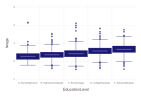

In [11]:
p3=Gadfly.plot(Z2, x=:EducationLevel, y=:lwage, Geom.boxplot,
    Theme(default_color="MidnightBlue", minor_label_font_size = 2.2mm),
    Scale.x_discrete(levels=levels(Z2.EducationLevel)),
    Guide.xticks(orientation=:horizontal)
)
p3

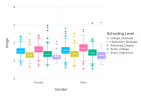

In [12]:
Gadfly.plot(Z2, x=:Gender, y=:lwage, color=:EducationLevel,
    Scale.x_discrete(levels=["Female", "Male"]),
    Geom.boxplot,
    Guide.manual_color_key("Schooling Level", ["College_Graduate", "Highschool_Graduate","Advanced_Degree","Some_College","Some_Highschool"]),
    Theme(key_position=:none),
)

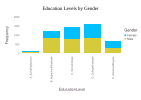

In [13]:
using Compose
Z3=copy(Z2)
insertcols!(Z3,4
    ,:Freq => 1)  
Z3=combine(groupby(Z3, [:Gender,:EducationLevel]),:Freq=>sum=>:Frequency)

p5 =Gadfly.plot(Z3, x=:EducationLevel,y=:Frequency, color=:Gender, Geom.bar(position=:stack),
    Scale.x_discrete(levels=levels(Z2.EducationLevel)),
    Theme(bar_spacing=4mm,grid_color = colorant"white", grid_color_focused = colorant"white", minor_label_font_size = 2.5mm),
    Guide.xticks(orientation=:vertical),
    )
p6 = title(render(p5), "Education Levels by Gender", Compose.fontsize(14pt))

### Experience

In [14]:
Z2=rename!(Z2, "exp1" => "Experience")

,wage,lwage,Gender,shs,hsg,scl,clg,ad,ne
,Float64,Float64,String,Float64,Float64,Float64,Float64,Float64,Float64
1,9.61538,2.26336,Female,0.0,0.0,0.0,4.0,0.0,1.0
2,48.0769,3.8728,Male,0.0,0.0,0.0,4.0,0.0,1.0
3,11.0577,2.40313,Male,0.0,2.0,0.0,0.0,0.0,1.0
4,13.9423,2.63493,Female,0.0,0.0,0.0,0.0,5.0,1.0
5,28.8462,3.36198,Female,0.0,0.0,0.0,4.0,0.0,1.0
6,11.7308,2.46222,Female,0.0,0.0,0.0,4.0,0.0,1.0
7,19.2308,2.95651,Female,0.0,2.0,0.0,0.0,0.0,1.0
8,19.2308,2.95651,Male,0.0,2.0,0.0,0.0,0.0,1.0
9,12.0,2.48491,Female,0.0,2.0,0.0,0.0,0.0,1.0


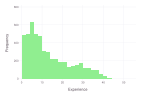

In [15]:
Gadfly.plot(Z2, x=:"Experience", Coord.cartesian(xmin=0, xmax=55),
    Geom.histogram(bincount=30, density=false, limits=(min=0,)),
    color=[colorant"lightgreen"],
    Guide.ylabel("Frequency"),
)

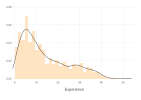

In [16]:
p8= Gadfly.plot(Z2, Coord.cartesian(xmin=0, xmax=55),
    layer(x = "Experience", Geom.density , color=[colorant"black"]),
    layer(x = "Experience", Geom.histogram(bincount=30, density=true, limits=(min=0,)),
    color=[colorant"bisque"]),
)

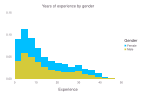

In [17]:
Gadfly.plot(Z2, x = "Experience", color="Gender", Geom.histogram(bincount=15, density=true), style(line_width=3mm),
    Theme(grid_color = colorant"white", grid_color_focused = colorant"white"),
    Guide.title("Years of experience by gender")
)

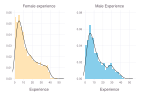

In [18]:
p1=Gadfly.plot(Z_female, Coord.cartesian(xmin=0, xmax=55),
    layer(x = "exp1", Geom.density , color=[colorant"black"]),
    layer(x = "exp1", Geom.histogram(bincount=25, density=true, limits=(min=0,)),
    color=[colorant"moccasin"]),
    Guide.title("Female experience"),
    Guide.xlabel("Experience")
)
p2=Gadfly.plot(Z_male, Coord.cartesian(xmin=0, xmax=55),
    layer(x = "exp1", Geom.density , color=[colorant"black"]),
    layer(x = "exp1", Geom.histogram(bincount=25, density=true, limits=(min=0,)),
    color=[colorant"skyblue"]),
    Guide.title("Male Experience"),
    Guide.xlabel("Experience")
)
gridstack([p1 p2])

### Scatter Plots

In [19]:
Gadfly.plot(Z2, x="Experience",y="lwage"
)
   

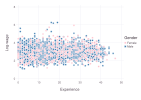

In [20]:
Gadfly.plot(Z2, x="Experience",y="lwage",color="Gender",
    Scale.color_discrete_manual("pink","steelblue"),
    Guide.ylabel("Log-wage")
)

## 3.2 Models

In [21]:
#install all the package that we can need
Pkg.add("Lathe")
Pkg.add("GLM") # package to run models 
Pkg.add("StatsPlots")
Pkg.add("MLBase")
Pkg.add("Tables")
Pkg.add("CovarianceMatrices") # robust standar error 
# Load the installed packages
using DataFrames
using CSV
using Tables
using Lathe
using GLM
using CovarianceMatrices


   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1

In [22]:
Z4=copy(data)
Z4=filter(row->row.shs in [1] || row.hsg in [1], Z4)
describe(Z4)

,variable,mean,min,median,max,nunique,nmissing,eltype
,Symbol,Union…,Any,Union…,Any,Union…,Nothing,DataType
1,wage,17.8544,3.36538,14.6154,528.846,,,Float64
2,lwage,2.71856,1.21354,2.68207,6.2707,,,Float64
3,sex,0.321948,0.0,0.0,1.0,,,Float64
4,shs,0.0872093,0.0,0.0,1.0,,,Float64
5,hsg,0.912791,0.0,1.0,1.0,,,Float64
6,scl,0.0,0.0,0.0,0.0,,,Float64
7,clg,0.0,0.0,0.0,0.0,,,Float64
8,ad,0.0,0.0,0.0,0.0,,,Float64
9,mw,0.286337,0.0,0.0,1.0,,,Float64


### Basic Model

In [23]:
basic  = @formula(lwage ~ (sex + exp1 + shs + hsg + mw + so + we + occ2+ ind2))
basic_results  = lm(basic, Z4)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

lwage ~ 1 + sex + exp1 + shs + hsg + mw + so + we + occ2 + ind2

Coefficients:
────────────────────────────────────────────────────────────────────────────────────
                   Coef.    Std. Error       t  Pr(>|t|)     Lower 95%     Upper 95%
────────────────────────────────────────────────────────────────────────────────────
(Intercept)   0.0         NaN           NaN       NaN     NaN           NaN
sex          -0.0733094     0.0314431    -2.33    0.0199   -0.134993     -0.0116259
exp1          0.00757417    0.00125148    6.05    <1e-08    0.00511908    0.0100293
shs           2.75187       0.144638     19.03    <1e-70    2.46813       3.03562
hsg           2.83301       0.139279     20.34    <1e-79    2.55978       3.10624
mw           -0.0431882     0.0362014    -1.19    0.2331   -0.114206      0.0278

### Flexible Model

In [24]:
import Pkg
Pkg.add("StatsModels")
Pkg.add("Combinatorics")
Pkg.add("IterTools")
# we have to configure the package internaly with the itertools package, this because 
#julia dont iunderstand (a formula) ^2, it takes as an entire term not as interactions 
#between variables

   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`
   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`


In [25]:

using StatsModels, Combinatorics, IterTools

combinations_upto(x, n) = Iterators.flatten(combinations(x, i) for i in 1:n)
expand_exp(args, deg::ConstantTerm) =
    tuple(((&)(terms...) for terms in combinations_upto(args, deg.n))...)

StatsModels.apply_schema(t::FunctionTerm{typeof(^)}, sch::StatsModels.Schema, ctx::Type) =
    apply_schema.(expand_exp(t.args_parsed...), Ref(sch), ctx)

StatsModels.apply_schema(t::FunctionTerm{typeof(^)}, sch::StatsModels.FullRank, ctx::Type) =
    apply_schema.(expand_exp(t.args_parsed...), Ref(sch), ctx)

In [26]:
extra_flex = @formula(lwage ~  sex + (exp1+exp2+exp3+exp4+shs+hsg+occ2+ind2+mw+so+we)^2)

control_fit = lm(extra_flex, Z4)
control_est = GLM.coef(control_fit)[2]

println("Number of Extra-Flex Controls: ", size(modelmatrix(control_fit))[2] -1) #minus the intercept
println("Coefficient for OLS with extra flex controls ", control_est)

#std error
control_se = GLM.stderror(control_fit)[2];

Number of Extra-Flex Controls: 876
Coefficient for OLS with extra flex controls -0.08105515267223506


In [27]:
control_fit = lm(extra_flex, Z4)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, LinearAlgebra.CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

lwage ~ 1 + sex + exp1 + exp2 + exp3 + exp4 + shs + hsg + occ2 + ind2 + mw + so + we + exp1 & exp2 + exp1 & exp3 + exp1 & exp4 + exp1 & shs + exp1 & hsg + exp1 & occ2 + exp1 & ind2 + exp1 & mw + exp1 & so + exp1 & we + exp2 & exp3 + exp2 & exp4 + exp2 & shs + exp2 & hsg + exp2 & occ2 + exp2 & ind2 + exp2 & mw + exp2 & so + exp2 & we + exp3 & exp4 + exp3 & shs + exp3 & hsg + exp3 & occ2 + exp3 & ind2 + exp3 & mw + exp3 & so + exp3 & we + exp4 & shs + exp4 & hsg + exp4 & occ2 + exp4 & ind2 + exp4 & mw + exp4 & so + exp4 & we + shs & hsg + shs & occ2 + shs & ind2 + shs & mw + shs & so + shs & we + hsg & occ2 + hsg & ind2 + hsg & mw + hsg & so + hsg & we + occ2 & ind2 + occ2 & mw + occ2 & so + occ2 & we + ind2 & mw + ind2 & so + ind2 & we + mw & so + mw & we + so & we

Coefficients:
────────────────────────────────

## 3.3 Coefficient Plot

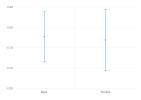

In [28]:
a = coef(basic_results)[2,1]
b = coef(control_fit)[2,1]
df = DataFrame(x=["Basic","Flexible"], y=[a,b], mins = [confint(basic_results)[2,1],confint(control_fit)[2,1]], maxs = [confint(basic_results)[2,2],confint(control_fit)[2,2]])
Gadfly.plot(df, x=:x, y=:y, ymin=:mins, ymax=:maxs,
        Geom.point, Geom.errorbar,
        Guide.xlabel(""),
        Guide.ylabel("")
)

## 4. Partialling-out using Lasso

In [29]:
Pkg.add("Lasso")
using Lasso

   Resolving package versions...
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Project.toml`
  No Changes to `C:\Users\Victoria\.julia\environments\v1.6\Manifest.toml`


## 4.1. Case 1

In [30]:
# Create main variables
Y = Z4[!, "lwage"]
Y = DataFrame([Y], [:Y])
D = Z4[!, "sex"]
D = DataFrame([D], [:D])
W1 = select(Z4, ["exp1" , "shs", "hsg", "mw", "so", "we", "occ2", "ind2"])
data1 = [Y D W1]

,Y,D,exp1,shs,hsg,mw,so,we,occ2,ind2
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Cat…,Cat…
1,2.40313,0.0,18.0,0.0,1.0,0.0,0.0,0.0,19,4
2,2.95651,1.0,42.0,0.0,1.0,0.0,0.0,0.0,17,14
3,2.95651,0.0,37.0,0.0,1.0,0.0,0.0,0.0,17,9
4,2.48491,1.0,31.0,0.0,1.0,0.0,0.0,0.0,13,19
5,2.85115,1.0,7.0,0.0,1.0,0.0,0.0,0.0,13,18
6,2.48651,0.0,30.0,0.0,1.0,0.0,0.0,0.0,14,18
7,3.32808,0.0,16.0,0.0,1.0,0.0,0.0,0.0,19,4
8,3.07269,0.0,27.0,0.0,1.0,0.0,0.0,0.0,19,4
9,2.95651,0.0,6.0,0.0,1.0,0.0,0.0,0.0,20,9


In [51]:
# Seat values for Lasso

lasso_model = fit(LassoModel, term(:Y) ~  sum(term.(names(data1[!, Not(["Y", "D"])]))), data1; α = 0.00077)
r_Y = residuals(lasso_model)
r_Y = DataFrame([r_Y], [:r_Y])

# Part. out d

lasso_model = fit(LassoModel, term(:D) ~  sum(term.(names(data1[!, Not(["Y", "D"])]))), data1;  α = 0.00077)
r_D = residuals(lasso_model)
r_D = DataFrame([r_D], [:r_D])

# ols 
data_aux = [r_Y r_D]
fm_1 = @formula(r_Y ~ r_D)
partial_lasso_fit = lm(fm_1, data_aux)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

r_Y ~ 1 + r_D

Coefficients:
──────────────────────────────────────────────────────────────────────────────
                    Coef.  Std. Error      t  Pr(>|t|)   Lower 95%   Upper 95%
──────────────────────────────────────────────────────────────────────────────
(Intercept)   1.14569e-15   0.0123242   0.00    1.0000  -0.0241762   0.0241762
r_D          -0.0719181     0.0309236  -2.33    0.0202  -0.132581   -0.0112556
──────────────────────────────────────────────────────────────────────────────

## 4.2 Case 2

In [52]:
# Set values for lasso
flex_y = @formula(lwage ~ (exp1+exp2+exp3+exp4+shs+hsg+occ2+ind2+mw+so+we)^2)
lasso_model2 = fit(LassoModel, flex_y, Z4, standardize = false, α = 0.00077)
r_Y2 = residuals(lasso_model2)
r_Y2 = DataFrame([r_Y2], [:r_Y2])

# Part. out d
flex_d = @formula(sex ~ ((exp1+exp2+exp3+exp4+shs+hsg+occ2+ind2+mw+so+we)^2))
lasso_model2 = fit(LassoModel, flex_d, Z4, standardize = false, α = 0.00077)
r_D2 = residuals(lasso_model2)
r_D2 = DataFrame([r_D2], [:r_D2])

# ols 
data_aux2 = [r_Y2 r_D2]
fm_2 = @formula(r_Y2 ~ r_D2)
partial_lasso_fit2 = lm(fm_2, data_aux2)

StatsModels.TableRegressionModel{LinearModel{GLM.LmResp{Vector{Float64}}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}}}}, Matrix{Float64}}

r_Y2 ~ 1 + r_D2

Coefficients:
──────────────────────────────────────────────────────────────────────────────
                    Coef.  Std. Error      t  Pr(>|t|)   Lower 95%   Upper 95%
──────────────────────────────────────────────────────────────────────────────
(Intercept)   1.38627e-15   0.0132266   0.00    1.0000  -0.0259464   0.0259464
r_D2         -0.118837      0.0283089  -4.20    <1e-04  -0.17437    -0.0633038
──────────────────────────────────────────────────────────────────────────────

## 4.3 Coeficient plot

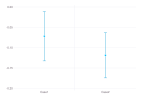

In [53]:
c = coef(partial_lasso_fit)[2,1]
d = coef(partial_lasso_fit2)[2,1]
df = DataFrame(x=["Case1","Case2"], y=[c,d], mins = [confint(partial_lasso_fit)[2,1],confint(partial_lasso_fit2)[2,1]], maxs = [confint(partial_lasso_fit)[2,2],confint(partial_lasso_fit2)[2,2]])
Gadfly.plot(df, x=:x, y=:y, ymin=:mins, ymax=:maxs,
        Geom.point, Geom.errorbar,
        Guide.xlabel(""),
        Guide.ylabel("")
)

## 4.4 Summarize the results

### Basic Model

In [54]:
using RData, LinearAlgebra, GLM, DataFrames, Statistics, Random, Distributions, DataStructures, NamedArrays, PrettyTables
import CodecBzip2

In [55]:
est_ols = coef(basic_results)[2]

# output: std. error
std_ols = stderror(basic_results)[2]

# output: 95% confidence interval
lower_ci = GLM.coeftable(basic_results).cols[5][2]
upper_ci = GLM.coeftable(basic_results).cols[6][2]

-0.01162585957144191

In [56]:
table_1 = NamedArray(zeros(1, 4))
setnames!(table_1, ["Basic Model"], 1)
table_1

1×4 Named Matrix{Float64}
      A ╲ B │   1    2    3    4
────────────┼───────────────────
Basic Model │ 0.0  0.0  0.0  0.0

In [57]:
table_1[1] = est_ols
table_1[2] = std_ols   
table_1[3] = lower_ci
table_1[4] = upper_ci    
 
table_1

1×4 Named Matrix{Float64}
      A ╲ B │          1           2           3           4
────────────┼───────────────────────────────────────────────
Basic Model │ -0.0733094   0.0314431   -0.134993  -0.0116259

In [58]:
table_1_pandas = DataFrame( table_1, [ :"Estimator", :"Std. Error", :"lower bound CI", :"upper bound CI"])
model_1 = DataFrame(model = ["OLS"])
table_1_pandas = hcat(model_1,table_1_pandas)
table_1_pandas

,model,Estimator,Std. Error,lower bound CI,upper bound CI
,String,Float64,Float64,Float64,Float64
1,OLS,-0.0733094,0.0314431,-0.134993,-0.0116259


In [59]:
header = (["Model", "Estimator", "Std. Error", "lower bound CI", "upper bound CI"])
pretty_table(table_1_pandas; backend = Val(:html), header = header, formatters=ft_round(6), alignment=:c)

Model,Estimator,Std. Error,lower bound CI,upper bound CI
OLS,-0.073309,0.031443,-0.134993,-0.011626


### Flexible Model

In [60]:
est_ols = coef(control_fit)[2]

# output: std. error
std_ols = stderror(control_fit)[2]

# output: 95% confidence interval
lower_ci = GLM.coeftable(control_fit).cols[5][2]
upper_ci = GLM.coeftable(control_fit).cols[6][2]

-0.006064073873593687

In [61]:
table_2 = NamedArray(zeros(1, 4))
setnames!(table_2, ["Flexible Model"], 1)
table_2

1×4 Named Matrix{Float64}
         A ╲ B │   1    2    3    4
───────────────┼───────────────────
Flexible Model │ 0.0  0.0  0.0  0.0

In [62]:
table_2[1] = est_ols
table_2[2] = std_ols   
table_2[3] = lower_ci
table_2[4] = upper_ci    
 
table_2

1×4 Named Matrix{Float64}
         A ╲ B │           1            2            3            4
───────────────┼───────────────────────────────────────────────────
Flexible Model │  -0.0810552    0.0382094    -0.156046  -0.00606407

In [63]:
table_2_pandas = DataFrame( table_2, [ :"Estimator", :"Std. Error", :"lower bound CI", :"upper bound CI"])
model_2 = DataFrame(model = ["Flexible"])
table_2_pandas = hcat(model_2,table_2_pandas)
table_2_pandas

,model,Estimator,Std. Error,lower bound CI,upper bound CI
,String,Float64,Float64,Float64,Float64
1,Flexible,-0.0810552,0.0382094,-0.156046,-0.00606407


In [64]:
header = (["Model", "Estimator", "Std. Error", "lower bound CI", "upper bound CI"])
pretty_table(table_2_pandas; backend = Val(:html), header = header, formatters=ft_round(6), alignment=:c)

Model,Estimator,Std. Error,lower bound CI,upper bound CI
Flexible,-0.081055,0.038209,-0.156046,-0.006064


### Lasso: case 1

In [65]:
est_ols = coef(partial_lasso_fit)[2]

# output: std. error
std_ols = stderror(partial_lasso_fit)[2]

# output: 95% confidence interval
lower_ci = GLM.coeftable(partial_lasso_fit).cols[5][2]
upper_ci = GLM.coeftable(partial_lasso_fit).cols[6][2]

-0.011255606897053787

In [66]:
table_3 = NamedArray(zeros(1, 4))
setnames!(table_3, ["Double-Lasso 1"], 1)
table_3

1×4 Named Matrix{Float64}
         A ╲ B │   1    2    3    4
───────────────┼───────────────────
Double-Lasso 1 │ 0.0  0.0  0.0  0.0

In [67]:
table_3[1] = est_ols
table_3[2] = std_ols   
table_3[3] = lower_ci
table_3[4] = upper_ci    
 
table_3

1×4 Named Matrix{Float64}
         A ╲ B │          1           2           3           4
───────────────┼───────────────────────────────────────────────
Double-Lasso 1 │ -0.0719181   0.0309236   -0.132581  -0.0112556

In [68]:
table_3_pandas = DataFrame( table_3, [ :"Estimator", :"Std. Error", :"lower bound CI", :"upper bound CI"])
model_3 = DataFrame(model = ["Double-Lasso 1"])
table_3_pandas = hcat(model_3,table_3_pandas)
table_3_pandas

,model,Estimator,Std. Error,lower bound CI,upper bound CI
,String,Float64,Float64,Float64,Float64
1,Double-Lasso 1,-0.0719181,0.0309236,-0.132581,-0.0112556


In [69]:
header = (["Model", "Estimator", "Std. Error", "lower bound CI", "upper bound CI"])
pretty_table(table_3_pandas; backend = Val(:html), header = header, formatters=ft_round(6), alignment=:c)

Model,Estimator,Std. Error,lower bound CI,upper bound CI
Double-Lasso 1,-0.071918,0.030924,-0.132581,-0.011256


### Lasso: case2

In [74]:
est_ols = coef(partial_lasso_fit2)[2]

# output: std. error
std_ols = stderror(partial_lasso_fit2)[2]

# output: 95% confidence interval
lower_ci = GLM.coeftable(partial_lasso_fit2).cols[5][2]
upper_ci = GLM.coeftable(partial_lasso_fit2).cols[6][2]

-0.06330375579003715

In [75]:
table_4 = NamedArray(zeros(1, 4))
setnames!(table_4, ["Double_Lasso 2"], 1)
table_4

1×4 Named Matrix{Float64}
         A ╲ B │   1    2    3    4
───────────────┼───────────────────
Double_Lasso 2 │ 0.0  0.0  0.0  0.0

In [76]:
table_4[1] = est_ols
table_4[2] = std_ols   
table_4[3] = lower_ci
table_4[4] = upper_ci    
 
table_4

1×4 Named Matrix{Float64}
         A ╲ B │          1           2           3           4
───────────────┼───────────────────────────────────────────────
Double_Lasso 2 │  -0.118837   0.0283089    -0.17437  -0.0633038

In [77]:
table_4_pandas = DataFrame( table_4, [ :"Estimator", :"Std. Error", :"lower bound CI", :"upper bound CI"])
model_4 = DataFrame(model = ["Double-Lasso 2"])
table_4_pandas = hcat(model_4,table_4_pandas)
table_4_pandas

,model,Estimator,Std. Error,lower bound CI,upper bound CI
,String,Float64,Float64,Float64,Float64
1,Double-Lasso 2,-0.118837,0.0283089,-0.17437,-0.0633038


In [78]:
header = (["Model", "Estimator", "Std. Error", "lower bound CI", "upper bound CI"])
pretty_table(table_4_pandas; backend = Val(:html), header = header, formatters=ft_round(6), alignment=:c)

Model,Estimator,Std. Error,lower bound CI,upper bound CI
Double-Lasso 2,-0.118837,0.028309,-0.17437,-0.063304


### All models

In [81]:
table_5 = vcat(table_1, table_2, table_3, table_4)
setnames!(table_5, ["OLS", "Flexible", "Double-Lasso1", "Double-Lasso2"], 1)
table_5

4×4 Named Matrix{Float64}
     vcat ╲ B │           1            2            3            4
──────────────┼───────────────────────────────────────────────────
OLS           │  -0.0733094    0.0314431    -0.134993   -0.0116259
Flexible      │  -0.0810552    0.0382094    -0.156046  -0.00606407
Double-Lasso1 │  -0.0719181    0.0309236    -0.132581   -0.0112556
Double-Lasso2 │   -0.118837    0.0283089     -0.17437   -0.0633038

In [82]:
table_5_pandas = DataFrame( table_5, [ :"Estimator", :"Std. Error", :"lower bound CI", :"upper bound CI"])
model_5 = DataFrame(model = ["OLS", "Flexible", "Double-Lasso1", "Double-Lasso2"])
table_5_pandas = hcat(model_5, table_5_pandas)
table_5_pandas

,model,Estimator,Std. Error,lower bound CI,upper bound CI
,String,Float64,Float64,Float64,Float64
1,OLS,-0.0733094,0.0314431,-0.134993,-0.0116259
2,Flexible,-0.0810552,0.0382094,-0.156046,-0.00606407
3,Double-Lasso1,-0.0719181,0.0309236,-0.132581,-0.0112556
4,Double-Lasso2,-0.118837,0.0283089,-0.17437,-0.0633038


In [83]:
header = (["Model", "Estimator", "Std. Error", "lower bound CI", "upper bound CI"])
pretty_table(table_5_pandas; backend = Val(:html), header = header, formatters=ft_round(6), alignment=:c)

Model,Estimator,Std. Error,lower bound CI,upper bound CI
OLS,-0.073309,0.031443,-0.134993,-0.011626
Flexible,-0.081055,0.038209,-0.156046,-0.006064
Double-Lasso1,-0.071918,0.030924,-0.132581,-0.011256
Double-Lasso2,-0.118837,0.028309,-0.17437,-0.063304


### Comments

* In this case, for both models (basic and flexible) the standard errors are very close, especially in the basic model. In that sense, it cannot be stated outright that the least squares method provides a noisy estimate. This situation is not surprising since p (20) is not comparable with n (5150).
* But it is necessary to mention that smaller standard errors were obtained using the partialling-out approach based on lasso regression ("Double Lasso"). Therefore, it can be said that with this last approach we obtain more precise estimates.
* Likewise, whether one or the other method is used, the question of whether there is a difference in estimated wages between men and women with the same relevant employment characteristics can be answered.